# Capstone Project
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
  1. [Venues derived from Foursquare API](#venues)
  2. [Legally operating businesses](#businesses)
  
  
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

In this project, we will try to find an optimal location for a legitimate business venture. This report will be targeted to stakeholders planning to start their business or interested in setting up a branch office for their firm in **Manhattan, New york**. 

Since there are a lot of places in Manhattan to consider for, while planning to set up a business, we will try to find out areas where **businesses are operating legally as authorized by the Department of Consumer Affairs (DCA)**. We will also take into consideration the count of **venue likes reviewed by Foursquare users**. This will provide an insight into the attractiveness of areas in the borough and so will aid the search.


## Data <a name="data"></a>

Based on the definition of our problem, factors that will influence our decision are:
* Nearby locations with a permissible business license issued by the Department of Consumer Affairs(DCA)
* Venues in Manhattan,NY that are popular among users(derived from Foursquare API)

Following data sources will be needed to extract/generate the required information:
* Businesses/individuals holding a DCA license so that they may legally operate in Manhattan will be obtained using data Provided by Department of Consumer Affairs (DCA) on [NYC Open Data](https://data.cityofnewyork.us/Business/Legally-Operating-Businesses/w7w3-xahh).
* number of venues, their category, user likes and location will be obtained using **Foursquare API**
* Boundaries for NYC zip codes will be extracted using [Github](https://github.com/fedhere/PUI2015_EC/blob/master/mam1612_EC/nyc-zip-code-tabulation-areas-polygons.geojson) data.


## Methodology <a name="methodology"></a>

In this project we will direct our efforts on detecting areas of Manhattan,NY that have ongoing businesses with active DCA-issued license, distinguished by industry type. We will limit our analysis to only those venues that are derived from Foursquare Regular API endpoints.

In first step we have collected the required **data: location and type (category) of explored venues**. We have also **identified users' likes per venue id** (according to venue id derived earlier).Later on, we imported the data provided by the Department of Consumer Affairs to inspect license status of various industries located in Manhattan.This will ensure that stakeholders find some place which is safer and legal to set off their businesses.

Second step in our analysis will be exploration of '**venues**'and '**businesses**' across different postal codes - we will use **choropleth maps** to identify areas with **active** and **inactive license status**. This will incorporate attention to areas with credible vicinity.

In third and final step we will focus on most promising areas and within those areas create **clusters of venues based on users' likes, by K-Means clustering algorithm**. We will take into consideration 4 clusters namely **Most Liked Places, Moderately Liked Places, Frequently Liked Places, Less Frequently Liked Places**, and then we cluster **businesses** according to the industry categories. We will present these clusters on map with a zoomed out **global cluster** and **zoomed in individual markers**. 

__Importing Libraries__

In [2]:
import numpy as np 

import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json 

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests 
from pandas.io.json import json_normalize 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means for clustering 
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes
import folium 

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


__Data from Foursqaure API__

Let's first find the latitude & longitude of Manhattan,NY using specific, well known address and explore venues using Foursquare API.

In [402]:
client_id='5I1TN5ZNXXPF3G3DGTXFRW5B1S5NGH53Q45NTGZYUEN454RA'
client_secret='ASVCDQUGSCL2DIFA2DRRMLL01HSGCCW55HA01YYEORMRZMYO'
version='20200713'

address='Manhattan,NY'
geolocator=Nominatim(user_agent='ny_explorer')
location=geolocator.geocode(address)
lat=location.latitude
lng=location.longitude
print('{},{} is the latitude & longitude of Manhattan'.format(lat,lng))

url='https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}'.format(client_id,client_secret,version,lat,lng)
url

40.7896239,-73.9598939 is the latitude & longitude of Manhattan


'https://api.foursquare.com/v2/venues/explore?&client_id=5I1TN5ZNXXPF3G3DGTXFRW5B1S5NGH53Q45NTGZYUEN454RA&client_secret=ASVCDQUGSCL2DIFA2DRRMLL01HSGCCW55HA01YYEORMRZMYO&v=20200713&ll=40.7896239,-73.9598939'

Now, let's create a dataframe with features returned by explore endpoint and keep only those features that will be essential for further data exploration.
We extract venue id, venue name, venue categories, latitude & longitude from the json file and transform it into a pandas dataframe.

In [403]:
results=requests.get(url).json()
venue_explore=results['response']['groups'][0]['items']
venue_explore=json_normalize(venue_explore)
venue_explore

,referralId,reasons.count,reasons.items,venue.id,venue.name,venue.location.address,venue.location.lat,venue.location.lng,venue.location.labeledLatLngs,venue.location.distance,venue.location.postalCode,venue.location.cc,venue.location.city,venue.location.state,venue.location.country,venue.location.formattedAddress,venue.categories,venue.photos.count,venue.photos.groups,venue.location.crossStreet,venue.location.neighborhood,venue.venuePage.id,venue.delivery.id,venue.delivery.url,venue.delivery.provider.name,venue.delivery.provider.icon.prefix,venue.delivery.provider.icon.sizes,venue.delivery.provider.icon.name
0,e-0-4a78425df964a52053e51fe3-0,0,"[{'summary': 'This spot is popular', 'type': '...",4a78425df964a52053e51fe3,Central Park Tennis Center,Central Park West at 96th St,40.789313,-73.961862,"[{'label': 'display', 'lat': 40.78931319964619...",169,10024,US,New York,NY,United States,"[Central Park West at 96th St, New York, NY 10...","[{'id': '4e39a956bd410d7aed40cbc3', 'name': 'T...",0,[],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e-0-4a5a4eb2f964a52021ba1fe3-1,0,"[{'summary': 'This spot is popular', 'type': '...",4a5a4eb2f964a52021ba1fe3,North Meadow,Central Park,40.792027,-73.959853,"[{'label': 'display', 'lat': 40.79202709807077...",267,NaN,US,New York,NY,United States,"[Central Park (at 97th St), New York, NY, Unit...","[{'id': '4bf58dd8d48988d163941735', 'name': 'P...",0,[],at 97th St,Central Park,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e-0-4ba233dbf964a5206fe337e3-2,0,"[{'summary': 'This spot is popular', 'type': '...",4ba233dbf964a5206fe337e3,East Meadow,Central Park,40.790160,-73.955498,"[{'label': 'display', 'lat': 40.79015961797437...",375,10029,US,New York,NY,United States,"[Central Park (5th Ave btwn 98th & 101st St), ...","[{'id': '4bf58dd8d48988d15f941735', 'name': 'F...",0,[],5th Ave btwn 98th & 101st St,Central Park,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e-0-4c841c2ed8086dcb246f8652-3,0,"[{'summary': 'This spot is popular', 'type': '...",4c841c2ed8086dcb246f8652,Central Park - Woodman's Gate,5th Ave,40.787786,-73.955924,"[{'label': 'display', 'lat': 40.78778566393158...",392,10009,US,New York,NY,United States,"[5th Ave (at E 96th St), New York, NY 10009, U...","[{'id': '4bf58dd8d48988d163941735', 'name': 'P...",0,[],at E 96th St,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e-0-4a229fa8f964a520797d1fe3-4,0,"[{'summary': 'This spot is popular', 'type': '...",4a229fa8f964a520797d1fe3,Jacqueline Kennedy Onassis Reservoir,Central Park,40.785064,-73.960163,NaN,508,10024,US,New York,NY,United States,"[Central Park (btwn 85th & 96th St), New York,...","[{'id': '56aa371be4b08b9a8d573541', 'name': 'R...",0,[],btwn 85th & 96th St,Central Park,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,e-0-4a746fb2f964a52025de1fe3-5,0,"[{'summary': 'This spot is popular', 'type': '...",4a746fb2f964a52025de1fe3,The Jewish Museum,1109 5th Ave,40.785276,-73.957411,"[{'label': 'display', 'lat': 40.7852755619908,...",527,10128,US,New York,NY,United States,"[1109 5th Ave (at E 92nd St), New York, NY 101...","[{'id': '4bf58dd8d48988d181941735', 'name': 'M...",0,[],at E 92nd St,NaN,33720137,NaN,NaN,NaN,NaN,NaN,NaN
6,e-0-4b67aad0f964a520265a2be3-6,0,"[{'summary': 'This spot is popular', 'type': '...",4b67aad0f964a520265a2be3,Central Park - Gate Of All Saints,Central Park West,40.791591,-73.964795,"[{'label': 'display', 'lat': 40.79159120682416...",467,NaN,US,New York,NY,United States,"[Central Park West (96th St), New York, NY, Un...","[{'id': '4bf58dd8d48988d163941735', 'name': 'P...",0,[],96th St,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,e-0-4b720819f964a520226b2de3-7,0,"[{'summary': 'This spot is popular', 'type': '...",4b720819f964a520226b2de3,K&D Wines & Spirits,1343 Madison Ave,40.787096,-73.954261,"[{'label': 'display', 'lat': 40.78709567131305...",551,10128,US,New York,NY,United States,"[1343 Madison Ave (at 96th St), New York, NY 1...","[{'id': '4bf58dd8d48988d119951735', 'name': 'W...",0,[],at 96th St,NaN,32823670,NaN,NaN,NaN,NaN,NaN,NaN
8,e-0-5328a418498e4be839240b62-8,0,"[{'summary': 'This 

In [404]:
venue_exp=venue_explore[['venue.id','venue.name','venue.location.lat','venue.location.lng']]

def get_category(row):
    category_list=row['venue.categories']
    if len(category_list)==0:
        return None
    else:
        return category_list[0]['name']
    

venue_exp['venue.categories']=venue_explore.apply(get_category,axis=1)

/Users/shreysharma/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [405]:
venue_exp

,venue.id,venue.name,venue.location.lat,venue.location.lng,venue.categories
0,4a78425df964a52053e51fe3,Central Park Tennis Center,40.789313,-73.961862,Tennis Court
1,4a5a4eb2f964a52021ba1fe3,North Meadow,40.792027,-73.959853,Park
2,4ba233dbf964a5206fe337e3,East Meadow,40.790160,-73.955498,Field
3,4c841c2ed8086dcb246f8652,Central Park - Woodman's Gate,40.787786,-73.955924,Park
4,4a229fa8f964a520797d1fe3,Jacqueline Kennedy Onassis Reservoir,40.785064,-73.960163,Reservoir
5,4a746fb2f964a52025de1fe3,The Jewish Museum,40.785276,-73.957411,Museum
6,4b67aad0f964a520265a2be3,Central Park - Gate Of All Saints,40.791591,-73.964795,Park
7,4b720819f964a520226b2de3,K&D Wines & Spirits,40.787096,-73.954261,Wine Shop
8,5328a418498e4be839240b62,Da Capo,40.787679,-73.953899,Café
9,4b8adef1f964a520728632e3,Central Park - Wild West Playground,40.789715,-73.965471,Playground


__Visualization of venue categories__

In [735]:
categories=venue_exp['venue.categories'].value_counts().sort_index()
categories

American Restaurant    1
Art Museum             1
Baseball Field         1
Bookstore              1
Café                   2
Field                  1
Fountain               1
French Restaurant      1
Garden                 1
History Museum         1
Kosher Restaurant      1
Museum                 1
Park                   5
Playground             4
Reservoir              1
Restaurant             1
Scenic Lookout         1
Tennis Court           1
Track                  1
Wine Shop              2
Yoga Studio            1
Name: venue.categories, dtype: int64

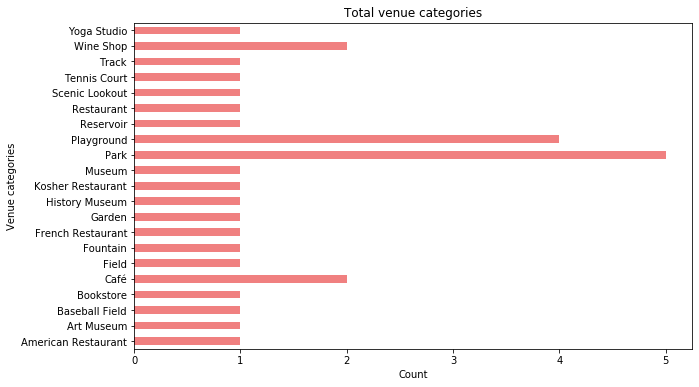

In [746]:
import matplotlib.pyplot as plt

categories.plot(kind='barh',figsize=(10,6),color='lightcoral')
plt.xlabel('Count')
plt.ylabel('Venue categories')
plt.title('Total venue categories')
plt.show()

> As per the above plot, there are total 5 Parks, 4 Playgrounds, 2 wine shops & Cafe and one of each other categories of venues present in the dataset.

Now, for each venue in the dataframe, user likes are obtained using suitable endpoint and are finally merged with the previous data so that we have user likes for each venue listed in the dataset. This will ensure that stakeholders get clear idea about the most liked categories and location of venues in Manhattan. 

In [352]:
venue_likes=[]
for i in venue_exp['venue.id']:
    url='https://api.foursquare.com/v2/venues/{}/likes?client_id={}&client_secret={}&v={}'.format(i,client_id,client_secret,version)
    results=requests.get(url).json()['response']['likes']['count']
    venue_likes.append(results)

In [406]:
venue_exp['venue.likes']=venue_likes
venue_exp

/Users/shreysharma/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,venue.id,venue.name,venue.location.lat,venue.location.lng,venue.categories,venue.likes
0,4a78425df964a52053e51fe3,Central Park Tennis Center,40.789313,-73.961862,Tennis Court,81
1,4a5a4eb2f964a52021ba1fe3,North Meadow,40.792027,-73.959853,Park,109
2,4ba233dbf964a5206fe337e3,East Meadow,40.790160,-73.955498,Field,211
3,4c841c2ed8086dcb246f8652,Central Park - Woodman's Gate,40.787786,-73.955924,Park,25
4,4a229fa8f964a520797d1fe3,Jacqueline Kennedy Onassis Reservoir,40.785064,-73.960163,Reservoir,742
5,4a746fb2f964a52025de1fe3,The Jewish Museum,40.785276,-73.957411,Museum,791
6,4b67aad0f964a520265a2be3,Central Park - Gate Of All Saints,40.791591,-73.964795,Park,34
7,4b720819f964a520226b2de3,K&D Wines & Spirits,40.787096,-73.954261,Wine Shop,32
8,5328a418498e4be839240b62,Da Capo,40.787679,-73.953899,Café,129
9,4b8adef1f964a520728632e3,Central Park - Wild West Playground,40.789715,-73.965471,Playground,26


## Analysis of Foursquare API derived venues  <a name="venues"></a>

On the basis of user likes, we now divide the venues into 4 clusters and add cluster labels to the dataset.

In [407]:
k=4
venue_cluster=venue_exp[['venue.likes']]

In [408]:
kmeans=KMeans(n_clusters=k,random_state=0,init='k-means++').fit(venue_cluster)
kmeans.labels_

array([2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 1, 0,
       2, 2, 0, 2, 2, 2, 2, 3], dtype=int32)

In [409]:
venue_exp.insert(0, 'Cluster Labels', kmeans.labels_)
venue_exp.head()

,Cluster Labels,venue.id,venue.name,venue.location.lat,venue.location.lng,venue.categories,venue.likes
0,2,4a78425df964a52053e51fe3,Central Park Tennis Center,40.789313,-73.961862,Tennis Court,81
1,2,4a5a4eb2f964a52021ba1fe3,North Meadow,40.792027,-73.959853,Park,109
2,2,4ba233dbf964a5206fe337e3,East Meadow,40.790160,-73.955498,Field,211
3,2,4c841c2ed8086dcb246f8652,Central Park - Woodman's Gate,40.787786,-73.955924,Park,25
4,0,4a229fa8f964a520797d1fe3,Jacqueline Kennedy Onassis Reservoir,40.785064,-73.960163,Reservoir,742


__Analyzing clusters based on users' likes__

In [410]:
venue_exp.loc[venue_exp['Cluster Labels'] == 0]

,Cluster Labels,venue.id,venue.name,venue.location.lat,venue.location.lng,venue.categories,venue.likes
4,0,4a229fa8f964a520797d1fe3,Jacqueline Kennedy Onassis Reservoir,40.785064,-73.960163,Reservoir,742
5,0,4a746fb2f964a52025de1fe3,The Jewish Museum,40.785276,-73.957411,Museum,791
12,0,4a2fc4d3f964a520da981fe3,Cooper Hewitt Smithsonian Design Museum,40.784333,-73.957765,Art Museum,832
21,0,561e89d6498e3c11a652381c,Five Pillars Yoga,40.784819,-73.956054,Yoga Studio,490
24,0,4b38f360f964a520e55225e3,Paola's Restaurant,40.784655,-73.955869,Restaurant,786


> *Cluster 0: Moderately liked places as per Foursquare users.*

In [411]:
venue_exp.loc[venue_exp['Cluster Labels']== 1]

,Cluster Labels,venue.id,venue.name,venue.location.lat,venue.location.lng,venue.categories,venue.likes
20,1,412d2800f964a520df0c1fe3,Central Park,40.784083,-73.964853,Park,21538


> *Cluster 1: Most liked places as per Foursquare users.*

In [412]:
venue_exp.loc[venue_exp['Cluster Labels']==2]

,Cluster Labels,venue.id,venue.name,venue.location.lat,venue.location.lng,venue.categories,venue.likes
0,2,4a78425df964a52053e51fe3,Central Park Tennis Center,40.789313,-73.961862,Tennis Court,81
1,2,4a5a4eb2f964a52021ba1fe3,North Meadow,40.792027,-73.959853,Park,109
2,2,4ba233dbf964a5206fe337e3,East Meadow,40.790160,-73.955498,Field,211
3,2,4c841c2ed8086dcb246f8652,Central Park - Woodman's Gate,40.787786,-73.955924,Park,25
6,2,4b67aad0f964a520265a2be3,Central Park - Gate Of All Saints,40.791591,-73.964795,Park,34
7,2,4b720819f964a520226b2de3,K&D Wines & Spirits,40.787096,-73.954261,Wine Shop,32
8,2,5328a418498e4be839240b62,Da Capo,40.787679,-73.953899,Café,129
9,2,4b8adef1f964a520728632e3,Central Park - Wild West Playground,40.789715,-73.965471,Playground,26
10,2,56cc9aa6498edc84f39f1cfd,Russ & Daughters,40.785332,-73.957481,Kosher Restaurant,102
11,2,4d6331414554a0934064afaa,Central Park - 99th & 5th Ave,40.788791,-73.955232,Park,16


> *Cluster 2: Less frequently liked places as per Foursquare users.*

In [413]:
venue_exp.loc[venue_exp['Cluster Labels']==3]

,Cluster Labels,venue.id,venue.name,venue.location.lat,venue.location.lng,venue.categories,venue.likes
29,3,4bd3118ab221c9b6bcbfd8d0,Whole Foods Wine Store,40.794285,-73.966558,Wine Shop,4121


> *Cluster 3: Frequently liked places as per Foursquare users.*

__Proportion of liked venues based on Foursquare users__

In [444]:
grouped_venue=pd.DataFrame(venue_exp.groupby(['Cluster Labels'])['venue.likes'].count())
grouped_venue

,venue.likes
Cluster Labels,
0,5
1,1
2,23
3,1


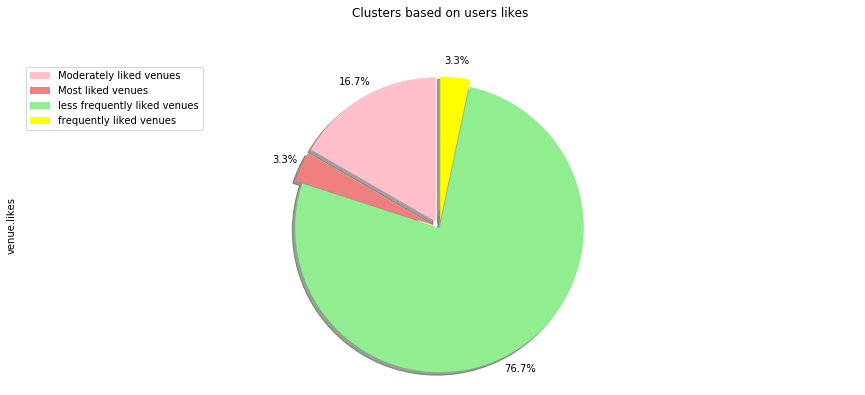

In [460]:
colors_list = ['pink', 'lightcoral', 'lightgreen', 'yellow']
explode_list = [0.05, 0.05, 0, 0.05] # ratio for each continent with which to offset each wedge.
label=['Moderately liked venues','Most liked venues','less frequently liked venues','frequently liked venues']

grouped_venue['venue.likes'].plot(kind='pie',
                            figsize=(15, 6),
                            autopct='%1.1f%%', 
                            startangle=90,    
                            shadow=True,       
                            labels=None,         # turn off labels on pie chart
                            pctdistance=1.12,    # the ratio between the center of each pie slice and the start of the text generated by autopct 
                            colors=colors_list,# add custom colors
                            explode=explode_list)

# scale the title up by 12% to match pctdistance
plt.title('Clusters based on users likes',y=1.12) 
plt.axis('equal') 

# add legend
plt.legend(labels=label, loc='upper left') 

plt.show()

## Analysis of legally operating businesses in Manhattan,NY <a name="businesses"></a>

Here we import data ,provided by DCA, of businesses/individuals with their license status to check on those locations in Manhattan borough where these are situated.
We merge this dataset with the geo json data containing the boundaries of New York City as per postal codes.Thus, analyzing each zip code and the corresponding license status in the map shown below.

In [210]:
!wget -O legal_bussiness.csv https://data.cityofnewyork.us/api/views/w7w3-xahh/rows.csv?accessType=DOWNLOAD

--2020-07-12 19:39:51--  https://data.cityofnewyork.us/api/views/w7w3-xahh/rows.csv?accessType=DOWNLOAD
Resolving data.cityofnewyork.us... 52.206.140.205, 52.206.140.199, 52.206.68.26
Connecting to data.cityofnewyork.us|52.206.140.205|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: 'legal_bussiness.csv'

legal_bussiness.csv     [                <=> ]  44.68M  4.23MB/s    in 10s     

2020-07-12 19:40:02 (4.34 MB/s) - 'legal_bussiness.csv' saved [46850338]



In [492]:
b=pd.read_csv('legal_bussiness.csv')
b=b[['Business Name','Address Borough','Address ZIP','Latitude','Longitude','License Status']]
b.dropna(subset=['Address Borough','Business Name','Address ZIP'],axis=0,inplace=True)
b=b[b['Address Borough']=='Manhattan']
b.reset_index(drop=True,inplace=True)
b['License Status']=pd.get_dummies(b['License Status'])
b.head()

/Users/shreysharma/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (19,20) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Business Name,Address Borough,Address ZIP,Latitude,Longitude,License Status
0,3571 BROADWAY INC.,Manhattan,10031,NaN,NaN,0
1,JZANUS LTD.,Manhattan,11010,NaN,NaN,1
2,NEW YORK SMSA LIMITED PARTNERSHIP,Manhattan,10001,40.749547,-73.987978,1
3,"GAMESTOP, INC.",Manhattan,10033,40.848482,-73.934357,1
4,"NABI, CHOUDHURY",Manhattan,10019,40.767110,-73.981719,1


In [493]:
b1=b[['Address ZIP','License Status']]
b1.head()

,Address ZIP,License Status
0,10031,0
1,11010,1
2,10001,1
3,10033,1
4,10019,1


In [542]:
!wget -O nyc_zipcode.json https://raw.githubusercontent.com/fedhere/PUI2015_EC/master/mam1612_EC/nyc-zip-code-tabulation-areas-polygons.geojson

--2020-07-15 17:51:14--  https://raw.githubusercontent.com/fedhere/PUI2015_EC/master/mam1612_EC/nyc-zip-code-tabulation-areas-polygons.geojson
Resolving raw.githubusercontent.com... 151.101.208.133
Connecting to raw.githubusercontent.com|151.101.208.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 606018 (592K) [text/plain]
Saving to: 'nyc_zipcode.json'

nyc_zipcode.json    100%[===================>] 591.81K  --.-KB/s    in 0.05s   

2020-07-15 17:51:14 (10.6 MB/s) - 'nyc_zipcode.json' saved [606018/606018]



In [663]:
with open('nyc_zipcode.json') as json_data:
    newyork_data = json.load(json_data)

In [637]:
newyork_data=json_normalize(newyork_data)
newyork_data=newyork_data['features']
ny_data=[v['properties']['postalCode'] for v in newyork_data]


In [765]:
data=pd.DataFrame()
data['Address ZIP']=ny_data
data.head()

,Address ZIP
0,11372
1,11004
2,11040
3,11426
4,11365


In [766]:
df=pd.merge(data,b1,on='Address ZIP')
df.head()

,Address ZIP,License Status
0,11001,0
1,10458,0
2,10034,1
3,10034,1
4,10034,0


__Businesses license status in Manhattan,NY per postal code__

In [763]:
address='Manhattan,NY'
geolocator=Nominatim(user_agent='nyx_exp')
location=geolocator.geocode(address)
latitude=location.latitude
longitude=location.longitude

manhattan_license=folium.Map([latitude,longitude],zoom_start=13,tiles='cartodbpositron')
manhattan_license.choropleth(geo_data=newyork_data,
    data=df,
    columns=['Address ZIP','License Status'],
    key_on='feature.properties.postalCode',                         
    fill_color='GnBu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='License Status')

In [764]:
manhattan_license

> **0**: Inactive License
          **1**: Active License

In [298]:
business=pd.read_csv('legal_bussiness.csv')
business=business[['License Status','Industry','Business Name','Address Borough','Longitude','Latitude']]
business['Address Borough']=business['Address Borough'].str.lower()
business=business[business['Address Borough']=='manhattan']
business.dropna(subset=['Latitude','Longitude','Address Borough'],axis=0,inplace=True)
business.reset_index(drop=True,inplace=True)

business.head()
#set(business['Industry'])
business=business[business['License Status']=='Active']
business.head()

/Users/shreysharma/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (19,20) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,License Status,Industry,Business Name,Address Borough,Longitude,Latitude
0,Active,Secondhand Dealer - General,NEW YORK SMSA LIMITED PARTNERSHIP,manhattan,-73.987978,40.749547
1,Active,Electronics Store,"GAMESTOP, INC.",manhattan,-73.934357,40.848482
2,Active,Tobacco Retail Dealer,"NABI, CHOUDHURY",manhattan,-73.981719,40.767110
5,Active,Sidewalk Cafe,"TAPPO, INC.",manhattan,-73.990769,40.742919
7,Active,Tobacco Retail Dealer,Rosalie Tuzzino,manhattan,-73.997634,40.718636


In [710]:
business_derived=business['Industry'].value_counts().sort_index()
business_derived

Amusement Arcade                     3
Amusement Device Permanent           3
Auction House Premises              15
Car Wash                             5
Dealer In Products                 111
Debt Collection Agency              59
Electronic & Appliance Service     125
Electronic Cigarette Dealer        866
Electronics Store                  582
Employment Agency                  114
Games of Chance                      6
Gaming Cafe                          2
Garage                             857
Garage and Parking Lot              72
General Vendor Distributor           2
Home Improvement Contractor       1088
Horse Drawn Cab Owner               57
Laundries                         1005
Newsstand                          277
Parking Lot                        129
Pawnbroker                          42
Pedicab Business                    47
Pool or Billiard Room                9
Process Serving Agency              20
Scale Dealer Repairer                2
Scrap Metal Processor    

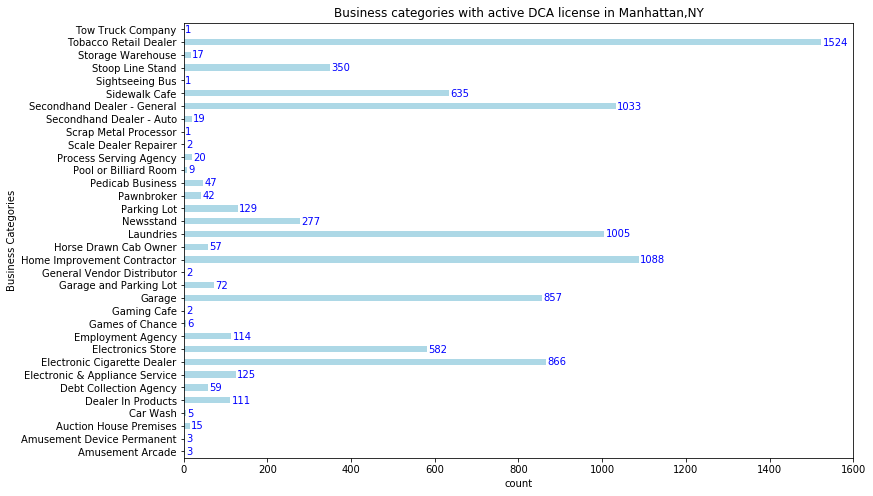

In [727]:
ax=business_derived.plot(kind='barh',figsize=(12,8),color='lightblue')

for i, v in enumerate(business_derived):
    ax.text(v + 3, i-0.25 , str(v), color='blue')
plt.xlabel('count')
plt.ylabel('Business Categories')
plt.title('Business categories with active DCA license in Manhattan,NY') 
plt.show()

__Businesses with DCA approved license around venues in Manhattan,NY__

Now, we group the markers/businesses into different clusters. Each cluster is then represented by the number of legit businesses in each neighborhood. These clusters can be thought of as pockets of Manhattan which we can then analyze separately.

To implement this, we start off by instantiating a MarkerCluster object and adding all the data points in the dataframe to this object.

In [747]:
address='Manhattan,NY'
geolocator=Nominatim(user_agent='nyx_exp')
location=geolocator.geocode(address)
latitude=location.latitude
longitude=location.longitude


map_mhtn = folium.Map(location=[latitude,longitude], zoom_start=16)
#map_mhtn

In [748]:
from folium import plugins

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map_mhtn)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label in zip(business['Latitude'], business['Longitude'], business['Industry']):
    folium.Marker(
        location=[lat, lng],
        icon=folium.Icon(color='red', icon='info-sign'),
        popup=label,
    ).add_to(incidents)

# display map
#map_mhtn

In [749]:
#set color
def color(cluster): 
    if cluster==0: 
        col = 'purple'
    elif cluster==1: 
        col = 'black'
    elif cluster==2:
        col = 'blue'
    else:
        col='pink'
    return col 


for lat,lon,name,ctg,like,cluster in zip(venue_exp['venue.location.lat'],venue_exp['venue.location.lng'],venue_exp['venue.name'],venue_exp['venue.categories'],venue_exp['venue.likes'],venue_exp['Cluster Labels']):
    label=folium.Popup(str(name)+', '+str(ctg)+', Total likes: '+str(like)+' Cluster '+str(cluster),parse_html=True)
    folium.Marker(
    [lat,lon],
    popup=label,
    icon=folium.Icon(color=color(cluster),icon='home')).add_to(map_mhtn)
    
    folium.CircleMarker(
    [lat,lon],
    radius=10,
    fill=True,
    fill_color=color(cluster),
    color=color(cluster),
    fill_opcaity=0.7).add_to(map_mhtn)

In [750]:
map_mhtn

> When we zoom out all the way, all markers are grouped into one cluster, the global cluster, of **9057 markers** or businesses, which is the **total number of businesses with active DCA approved license** in our dataframe. Once we start zooming in, the global cluster will start breaking up into smaller clusters. Zooming in all the way will result in individual markers.

## Results and Discussion <a name="results"></a>

Our analysis shows that there is a great number of places in Manhattan to choose for business ventures. Areas in **Uptown, Midtown and Downtown** are shown taking into consideration their license status as issued by DCA. The choropleth map takes into account all the areas (as per the zip codes) though, we will keep our focus on areas in Uptown,Manhattan as the API derived venues are highly concentrated over there.
As we can observe there are comparatively more pockets of businesses/individuals, with legal authorization, operating fairly close to **Upper east side**. Dense gathering was detected in between **east 89th Street and east 98th Street**, so we focused our attention to areas around these streets along **Madison Avenue, 5th Avenue and Park Avenue** with majoroty of **Moderately liked venues** and **Less Frquently liked venues** as per Foursquare users. Another locality was identified as potentially interesting (on **Columbus Avenue between West 97th Street and West 100th Street**), but our attention was focused on **Upper east side** which offer a combination of popularity among visitors, strong socio-economic dynamics *and* a number of pockets of DCA-issued active license holding businesses.

The **API derived venues and their corresponding likes** were initially clustered to create categories of interest which contain groups that aids our search for appropriate place to set up an office for stakeholders' business interest. Name,category and venue likes were also generated using reverse geocoding that is used as markers for more detailed local analysis. The pockets of **legally operating businesses** pops up the category of business industry that falls under formed clusters.

This, of course, does not imply that these are the only factors to be considered while searching for an optimal location for a new business set up or starting a new branch office. Purpose of this analysis was to only provide information about areas in Manhattan (located in Upper east side) that might fit stakeholders' search criteria- it is entirely possible that there might be a very good reason to not choose these areas based on the high land/buildings prices, which would make them unsuitable for a new startup regardless of popularity among visitors in the area. Recommended areas should therefore be considered only as a starting point for more detailed analysis which could eventually result in location which has not only attractiveness of venues and legal operating busineses around but also other factors taken into account and all other relevant conditions met.

## Conclusion <a name="conclusion"></a>

Purpose of this project was to identify areas in Manhattan with more popularity among visitors and legitimacy of businesses around different postal areas in Manhattan borough in order to facilitate stakeholders in narrowing down the search for optimal location for a new business setup. By gathering information about venues and merging it with the user likes distribution from Foursquare data we have first identified certain locations that are distinguished by user likes count and venue categories that justify further analysis, and then generated extensive collection of locations- distributed on the basis of zip code, which satisfy some basic requirements required to run a business. Clustering of those locations was then performed in order to create major marks of interest (containing total number of businesses that satisfy legal conditions and categorized by the industry type) and addresses of API derived venues were pinpointed which is to be used as starting points for final exploration by stakeholders.

Final decision on optimal location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended place, taking into consideration additional factors like pricing, commutation, real estate availability, social and economic dynamics of every neighborhood etc.